In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy import io
import os
import re

# Summary

1. $\alpha$ = learning rate (0 < $\alpha$ < 1)
2. $\kappa$ = coefficient multiplied to the learning rate for counterfactual update (0 < $\kappa$ < 1)
3. $\beta$ = inverse temperature (0 < $\beta$ < 10)
4. $w$ = model-based vs. model-free (0 < $w$ < 1)
5. $\gamma$ = decay rate (0 < $\gamma$ < 1)

## 1. Correlation done in "true" parameter space

|   |          | Total 200 trials |      |      |  100 trials per first-stage state |      |      |
:---|:----------:|------------|------|------|-----------------|------|------:
| Parameter  | n second-stage states | TD         | C1   | C2   | TD              | C1   | C2   |
| **$\alpha$**  | 2        | 0.29       | 0.52 | 0.4  | 0.24            | 0.33 | 0.3  |
|   | 3        | 0.21       | 0.33 | 0.18 | 0.27            | 0.32 | 0.31 |
|   | 4        | 0.19       | 0.25 | 0.18 | 0.24            | 0.34 | 0.29 |
|   | 5        | 0.15       | 0.16 | 0.13 | 0.29            | 0.32 | 0.24 |
| **$\kappa$**  | 2        |            |      | 0.16 |                 |      | 0.1  |
|   | 3        |            |      | 0.17 |                 |      | 0.25 |
|   | 4        |            |      | 0.12 |                 |      | 0.26 |
|   | 5        |            |      | 0.12 |                 |      | 0.29 |
| **$\beta$**  | 2        | 0.52       | 0.68 | 0.63 | 0.51            | 0.52 | 0.51 |
|   | 3        | 0.28       | 0.29 | 0.3  | 0.42            | 0.5  | 0.39 |
|   | 4        | 0.29       | 0.28 | 0.24 | 0.35            | 0.34 | 0.34 |
|   | 5        | 0.23       | 0.23 | 0.2  | 0.39            | 0.38 | 0.34 |
| **$w$**  | 2        | 0.42       | 0.43 | 0.38 | 0.33            | 0.29 | 0.23 |
|   | 3        | 0.31       | 0.41 | 0.29 | 0.46            | 0.43 | 0.41 |
|   | 4        | 0.3        | 0.27 | 0.25 | 0.4             | 0.42 | 0.39 |
|   | 5        | 0.24       | 0.28 | 0.23 | 0.46            | 0.48 | 0.47 |
| **$\gamma$**  | 2        | 0.32       | 0.0  | 0.0  | 0.23            | 0.0  | 0.0  |
|   | 3        | 0.26       | 0.32 | 0.26 | 0.43            | 0.38 | 0.35 |
|   | 4        | 0.27       | 0.22 | 0.22 | 0.39            | 0.43 | 0.36 |
|   | 5        | 0.17       | 0.24 | 0.21 | 0.39            | 0.47 | 0.45 |

C1 = counterfactual with 1 learning rate ($\alpha$), C2 = counterfactual with two learning rates ($\alpha$, $\kappa\alpha$)
 
 * Notes & thoughts:
1. 100 trials per first-stage state: experiments with 2 second-stage states have 100, 3 states have 300, 4 states have 600, and 5 states have 1000 total trials. It does seem having trials proportionate to number of states improve recovery as the number of states increase.
2. $\gamma$s are 0 for experiments with 2 second-stage states. This is because there's only 1 first-stage state and you see that state every trial, so there's nothing to discount.
3. Low performance for $\alpha2$: is it correct that the counterfactual options updates the model-free Q(s,a) value, second-state Q(s) value, and eligibility trace? I'll check again if I implemented the different learning rates correctly - right after I wrote this I inspected the code again, and found another potential concern lol (I didn't update the model-free Q(s,a) for counterfactual (so I didn't update Q_mf(s, a_counterfactual)). So for now, please ignore the results for two-alpha counterfactuals and just have a look at TD and counterfactual using  I'll update you with the results shortly. 
4. Overall, more number of trials improve better than counterfactual alone for higher nstates.
 

# 1. Total number of trials fixed to 200

## 1-1) TD (no counterfactual)

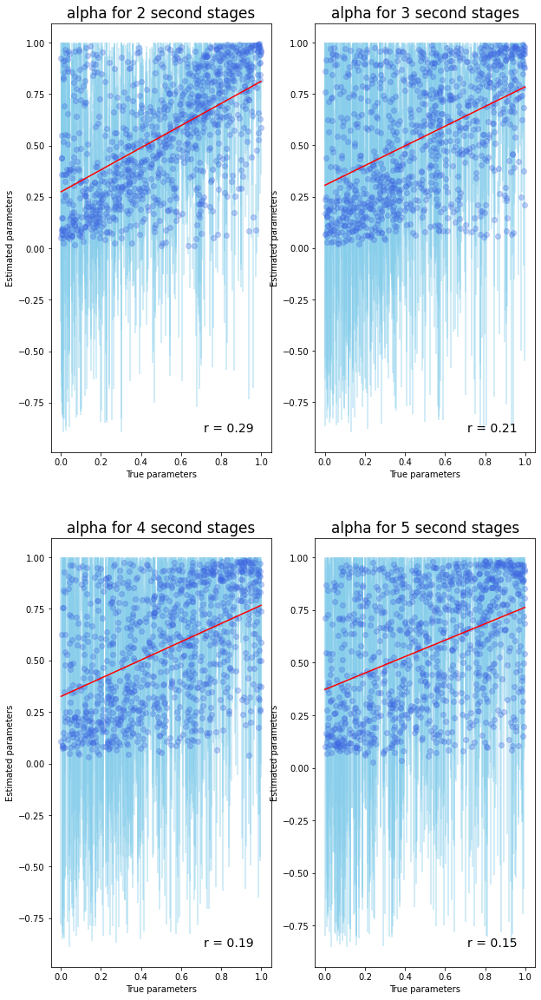

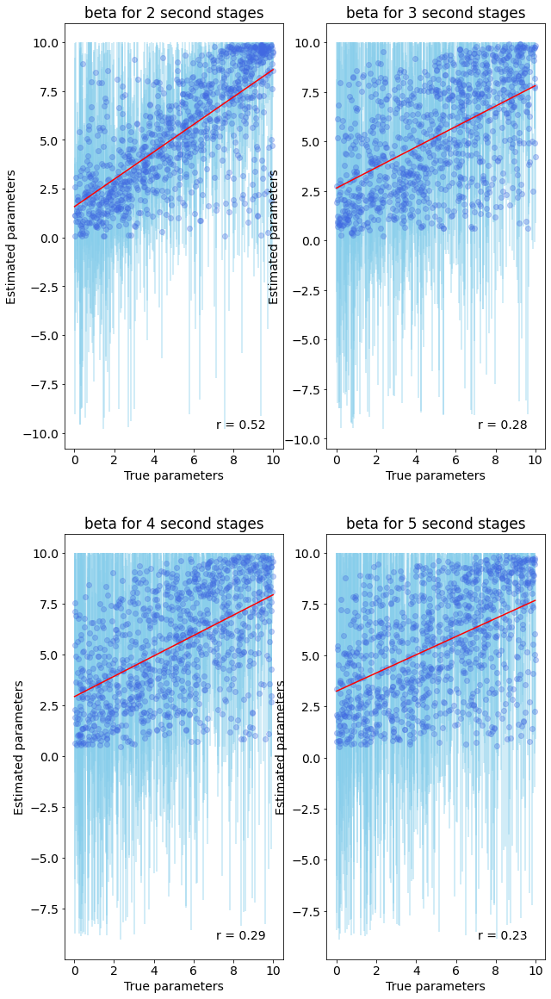

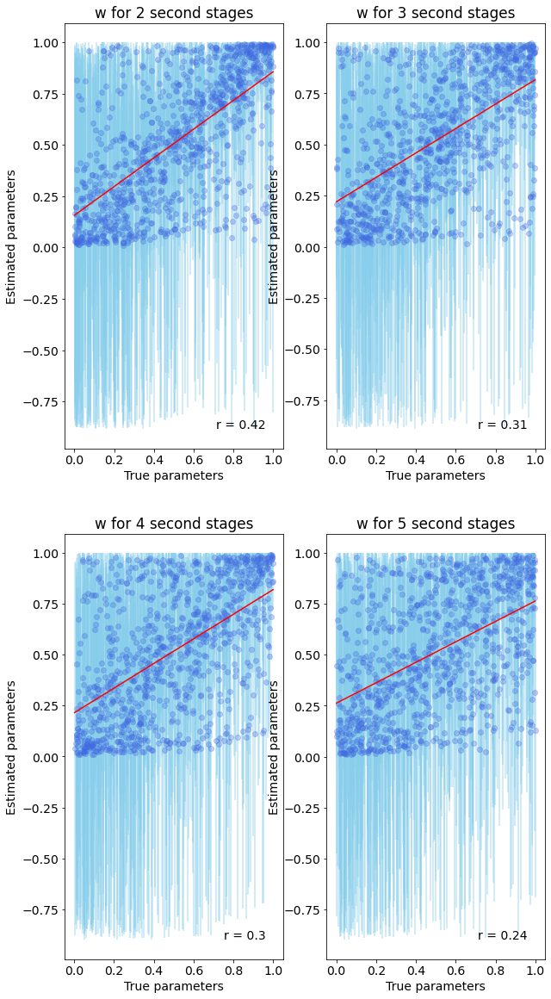

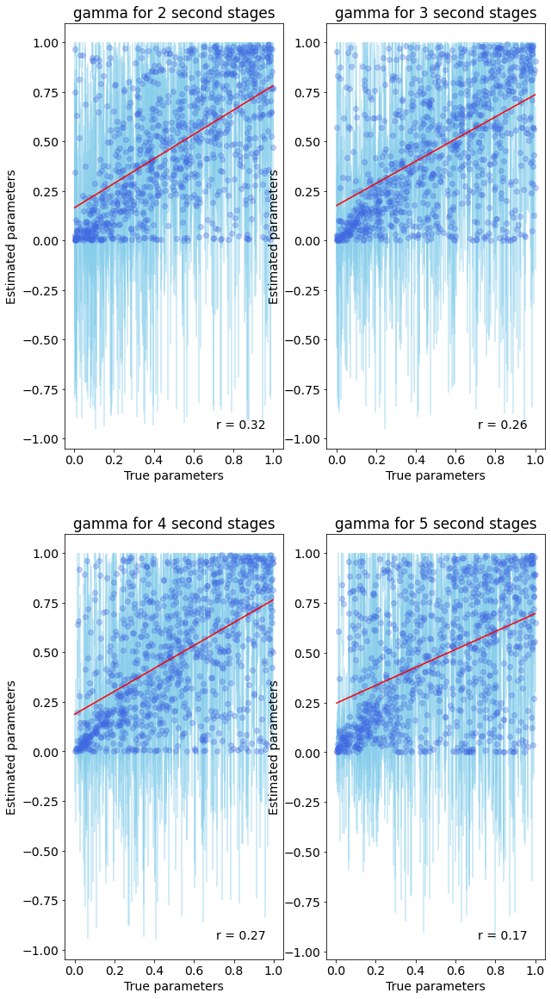

In [2]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]

        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})

        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')

        ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
        
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        
#         print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        datatable.append(np.round(r2,2))

# for i in datatable:
#     print(i)

## 1-2) Counterfactual: one learning rate (alpha)

The correlation coefficient for alpha 2 stages: 0.52
The correlation coefficient for alpha 3 stages: 0.33
The correlation coefficient for alpha 4 stages: 0.25
The correlation coefficient for alpha 5 stages: 0.16
The correlation coefficient for beta 2 stages: 0.68
The correlation coefficient for beta 3 stages: 0.29
The correlation coefficient for beta 4 stages: 0.28
The correlation coefficient for beta 5 stages: 0.23
The correlation coefficient for w 2 stages: 0.43
The correlation coefficient for w 3 stages: 0.41
The correlation coefficient for w 4 stages: 0.27
The correlation coefficient for w 5 stages: 0.28
The correlation coefficient for gamma 2 stages: 0.0
The correlation coefficient for gamma 3 stages: 0.32
The correlation coefficient for gamma 4 stages: 0.22
The correlation coefficient for gamma 5 stages: 0.24
0.52
0.33
0.25
0.16
0.68
0.29
0.28
0.23
0.43
0.41
0.27
0.28
0.0
0.32
0.22
0.24


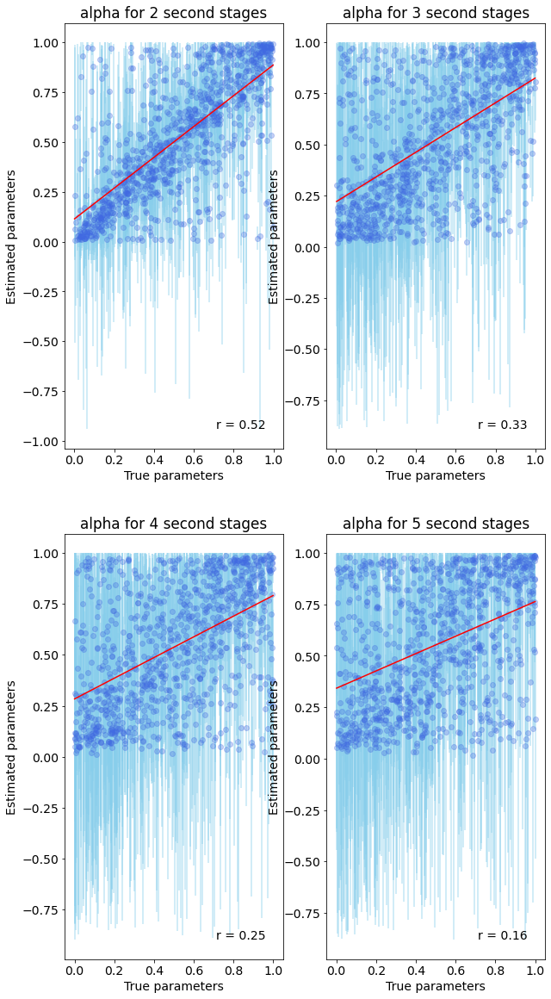

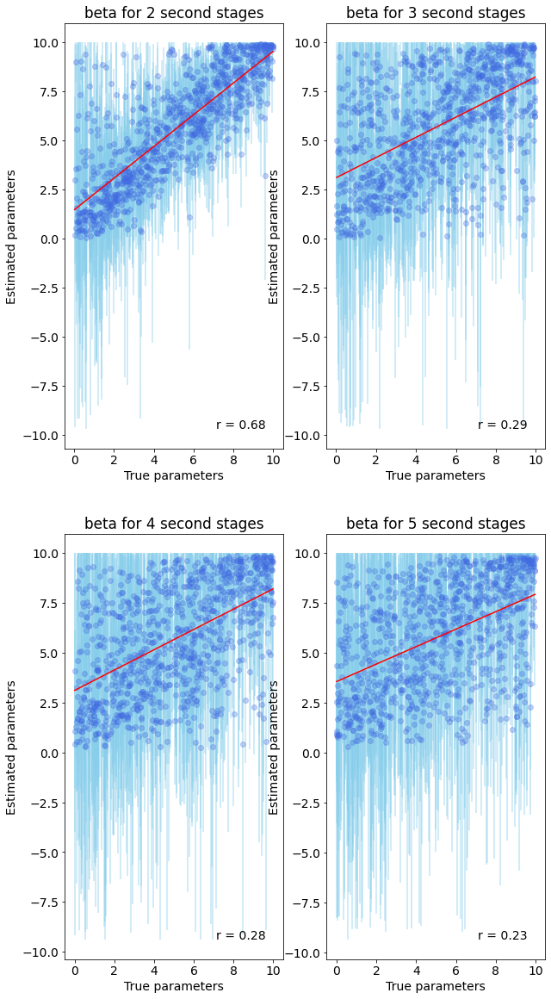

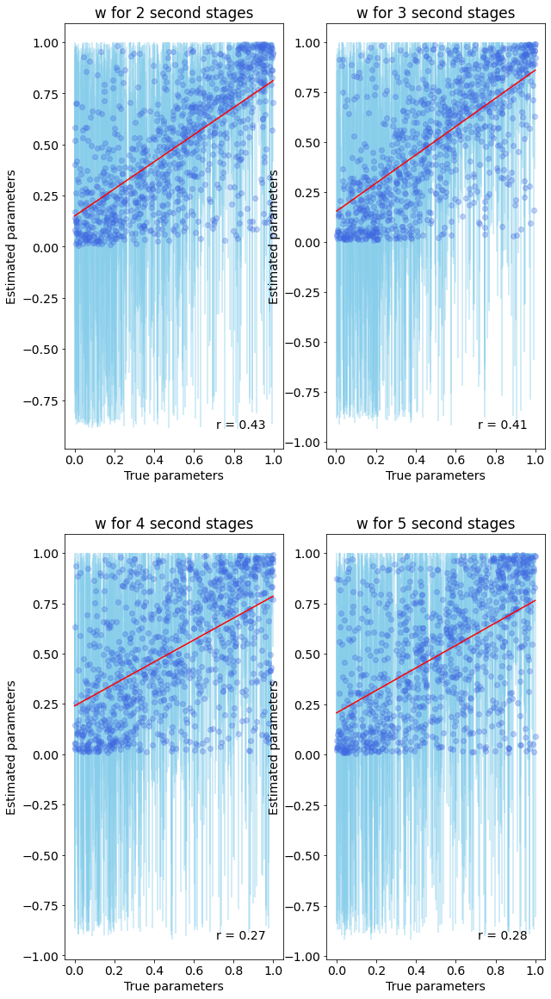

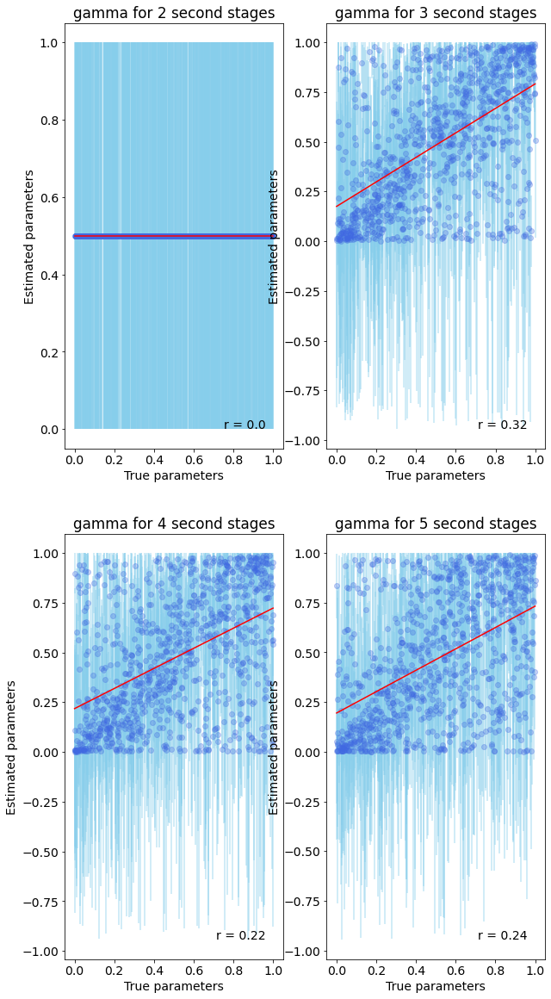

In [3]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')

    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_1alpha_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'


        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]

        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})
         
        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')

        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        
        datatable.append(np.round(r2,2))

for i in datatable:
    print(i)

## 1-3) Counterfactual: two learning rates 

The correlation coefficient for alpha 2 stages: 0.4
The correlation coefficient for alpha 3 stages: 0.18
The correlation coefficient for alpha 4 stages: 0.18
The correlation coefficient for alpha 5 stages: 0.13
The correlation coefficient for kappa 2 stages: 0.16
The correlation coefficient for kappa 3 stages: 0.17
The correlation coefficient for kappa 4 stages: 0.12
The correlation coefficient for kappa 5 stages: 0.12
The correlation coefficient for beta 2 stages: 0.63
The correlation coefficient for beta 3 stages: 0.3
The correlation coefficient for beta 4 stages: 0.24
The correlation coefficient for beta 5 stages: 0.2
The correlation coefficient for w 2 stages: 0.38
The correlation coefficient for w 3 stages: 0.29
The correlation coefficient for w 4 stages: 0.25
The correlation coefficient for w 5 stages: 0.23
The correlation coefficient for gamma 2 stages: 0.0
The correlation coefficient for gamma 3 stages: 0.26
The correlation coefficient for gamma 4 stages: 0.22
The correlation c

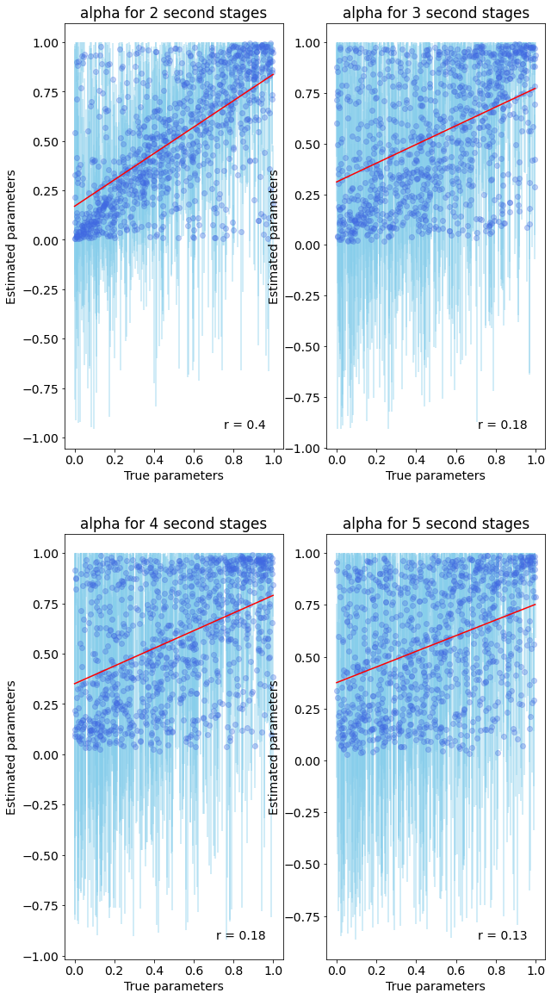

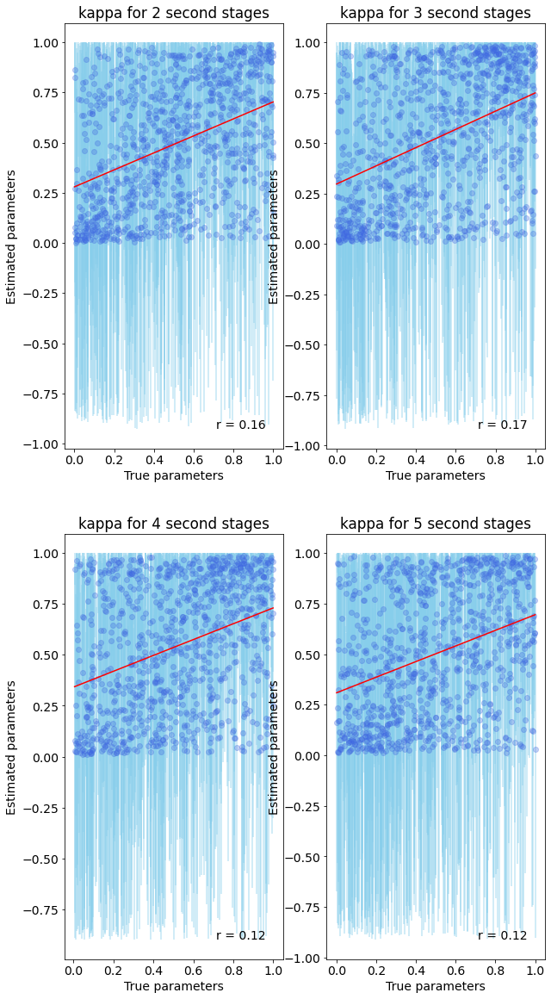

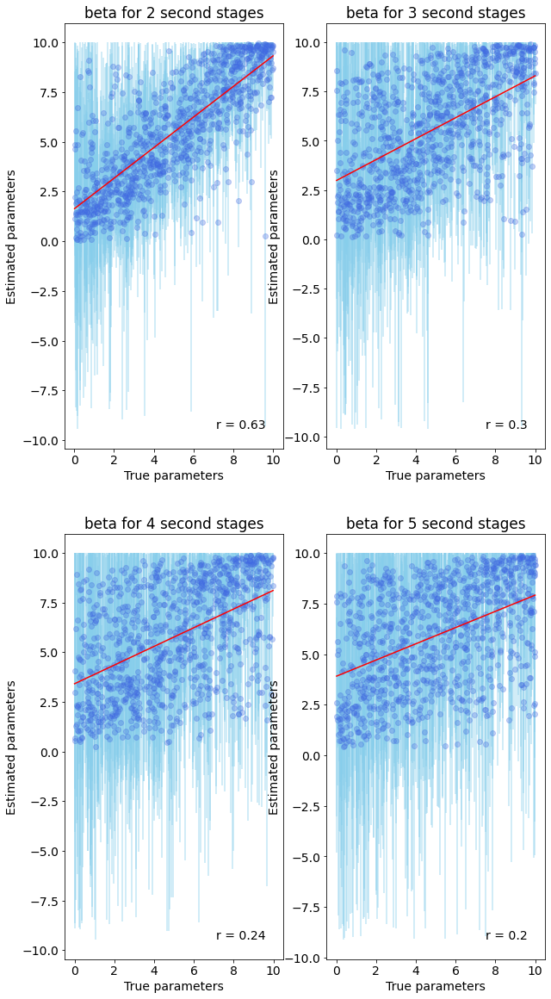

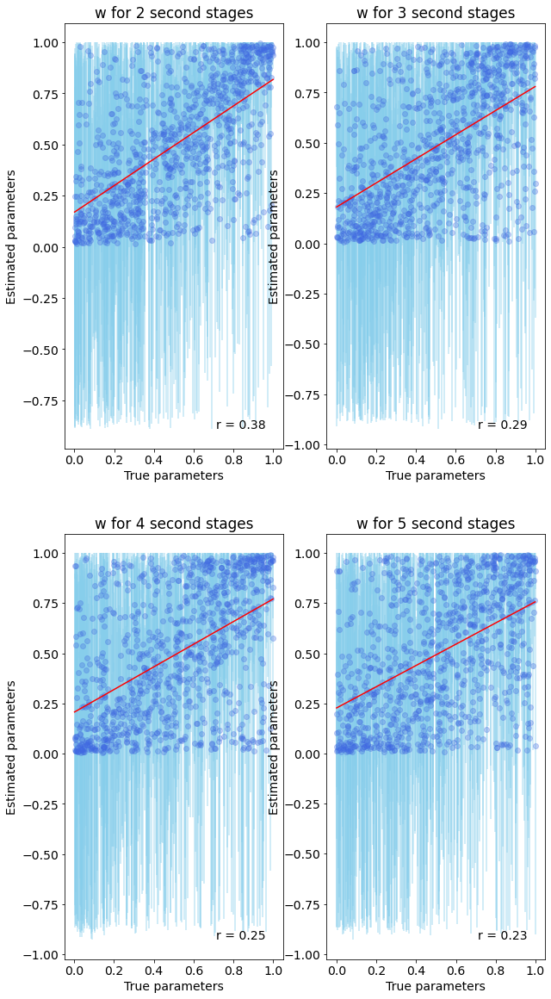

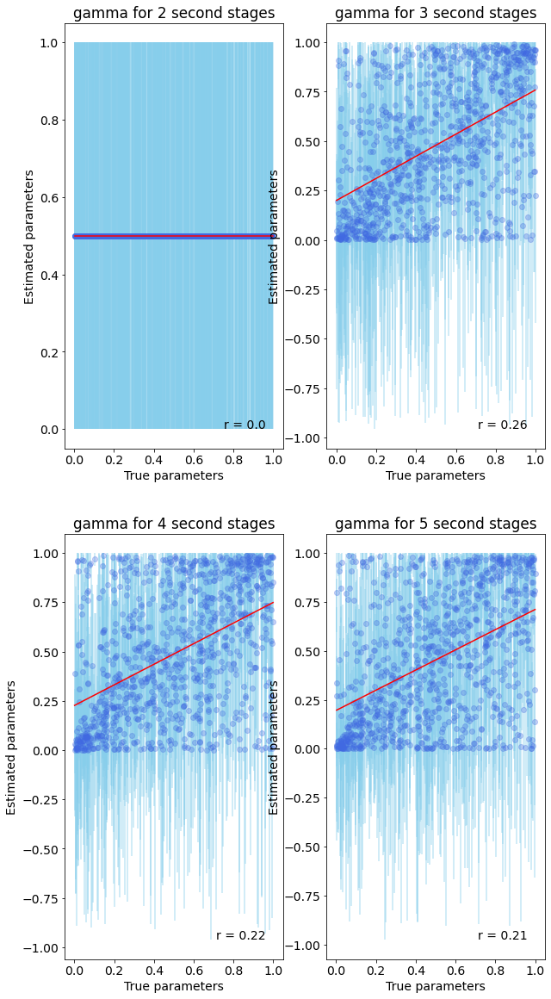

In [4]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'kappa', 'beta', 'w', 'gamma']
datatable = []
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_diff_lr_' + str(second_stages[s]) + 'states_5params_nrits1000.mat'


        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]

        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})   
    
        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')
        
        ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
        
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))

        datatable.append(np.round(r2,2))
for i in datatable:
    print(i)

# 2. Number of trials proportionate to number of first-stage states (100 each; 100 trials for 2, 300 trials for 3, 600 trials for 4, and 1000 trials for 5 second states)

## 2-1) TD (no counterfactual)

The correlation coefficient for alpha 2 stages: 0.24
The correlation coefficient for alpha 3 stages: 0.27
The correlation coefficient for alpha 4 stages: 0.24
The correlation coefficient for alpha 5 stages: 0.29
The correlation coefficient for beta 2 stages: 0.51
The correlation coefficient for beta 3 stages: 0.42
The correlation coefficient for beta 4 stages: 0.35
The correlation coefficient for beta 5 stages: 0.39
The correlation coefficient for w 2 stages: 0.33
The correlation coefficient for w 3 stages: 0.46
The correlation coefficient for w 4 stages: 0.4
The correlation coefficient for w 5 stages: 0.46
The correlation coefficient for gamma 2 stages: 0.23
The correlation coefficient for gamma 3 stages: 0.43
The correlation coefficient for gamma 4 stages: 0.39
The correlation coefficient for gamma 5 stages: 0.39
0.24
0.27
0.24
0.29
0.51
0.42
0.35
0.39
0.33
0.46
0.4
0.46
0.23
0.43
0.39
0.39


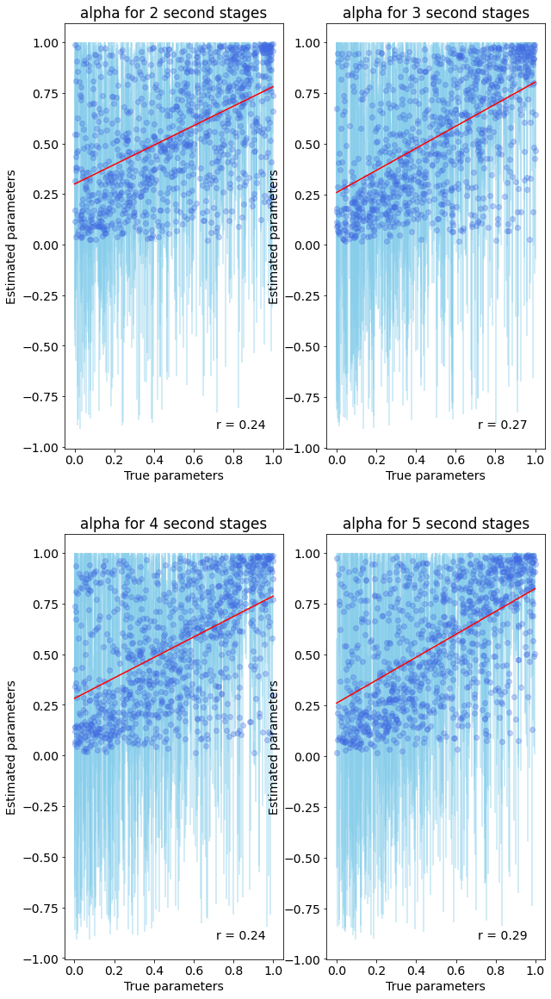

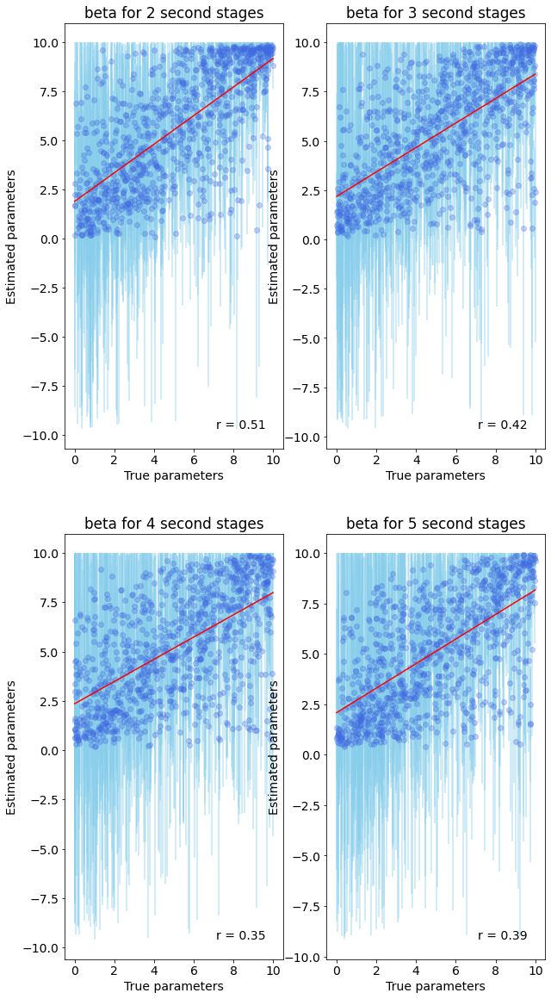

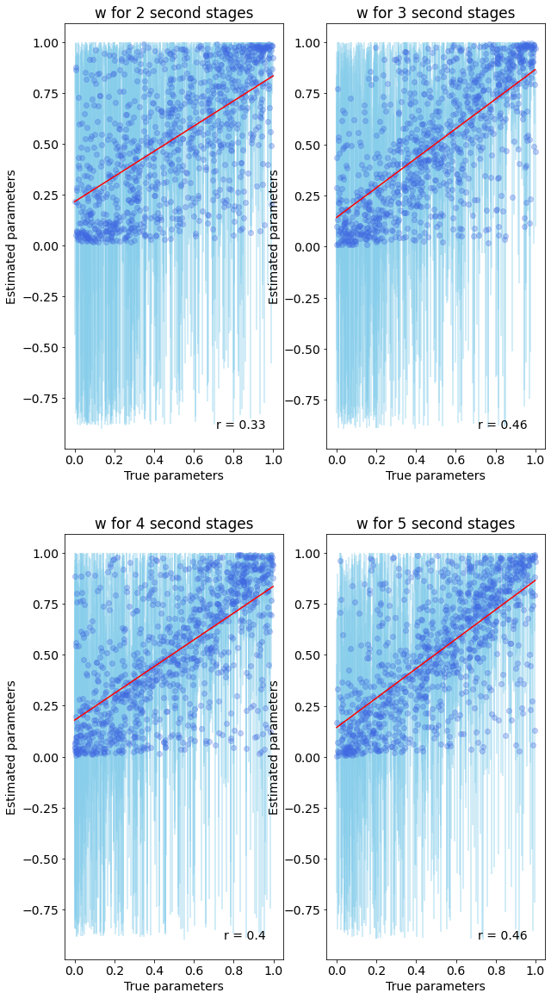

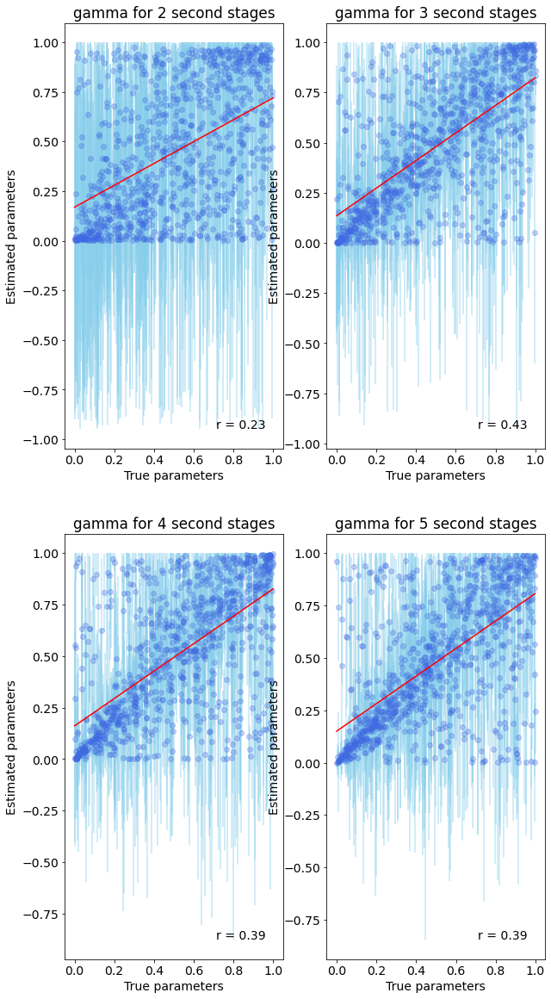

In [5]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_moretrials_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]

        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})
     
        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')
        ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))

        datatable.append(np.round(r2,2))
for i in datatable:
    print(i)

## 2-2) Counterfactual: one learning rate (alpha)

The correlation coefficient for alpha 2 stages: 0.33
The correlation coefficient for alpha 3 stages: 0.32
The correlation coefficient for alpha 4 stages: 0.34
The correlation coefficient for alpha 5 stages: 0.32
The correlation coefficient for beta 2 stages: 0.52
The correlation coefficient for beta 3 stages: 0.5
The correlation coefficient for beta 4 stages: 0.34
The correlation coefficient for beta 5 stages: 0.38
The correlation coefficient for w 2 stages: 0.29
The correlation coefficient for w 3 stages: 0.43
The correlation coefficient for w 4 stages: 0.42
The correlation coefficient for w 5 stages: 0.48
The correlation coefficient for gamma 2 stages: 0.0
The correlation coefficient for gamma 3 stages: 0.38
The correlation coefficient for gamma 4 stages: 0.43
The correlation coefficient for gamma 5 stages: 0.47
0.33
0.32
0.34
0.32
0.52
0.5
0.34
0.38
0.29
0.43
0.42
0.48
0.0
0.38
0.43
0.47


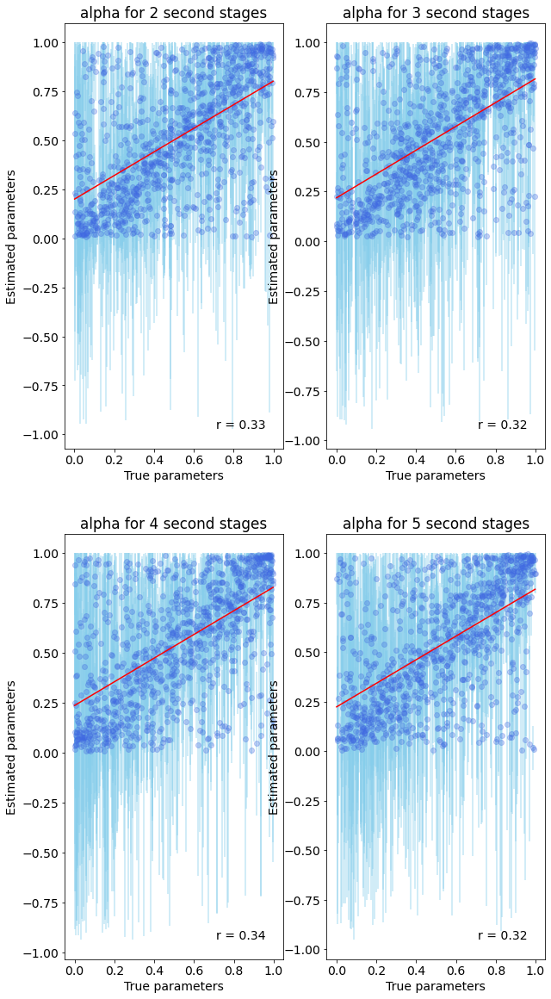

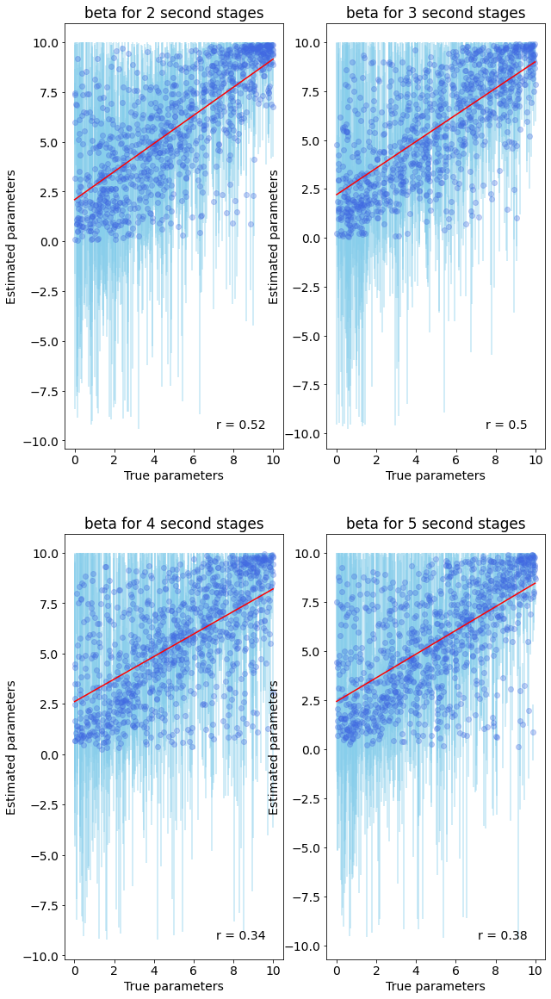

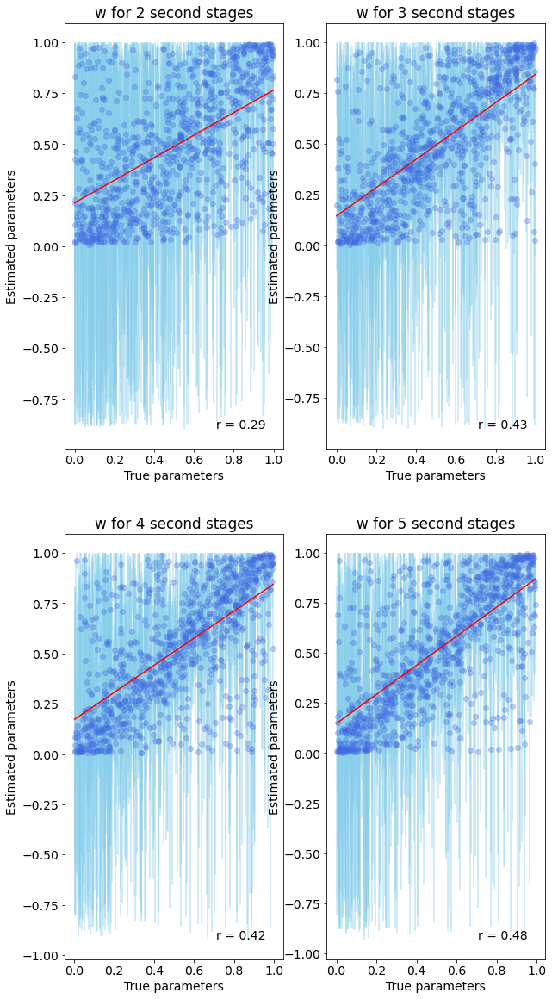

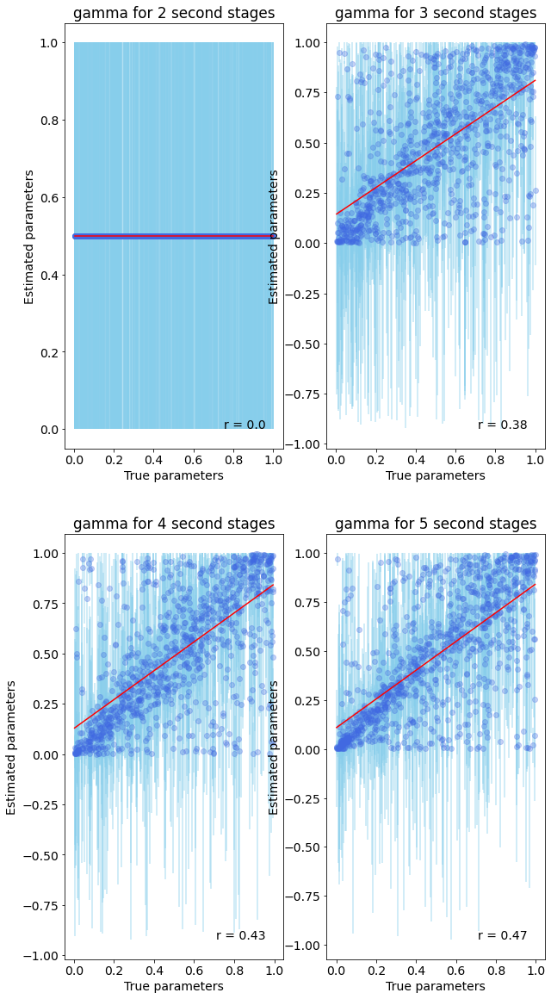

In [6]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')

    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_moretrials_1alpha_' + str(second_stages[s]) + 'states_4params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]

        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})
               
        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')
        ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))
        datatable.append(np.round(r2,2))

for i in datatable:
    print(i)

## 2-3. Counterfactual: two learning rates

The correlation coefficient for alpha 2 stages: 0.3
The correlation coefficient for alpha 3 stages: 0.31
The correlation coefficient for alpha 4 stages: 0.29
The correlation coefficient for alpha 5 stages: 0.24
The correlation coefficient for kappa 2 stages: 0.1
The correlation coefficient for kappa 3 stages: 0.25
The correlation coefficient for kappa 4 stages: 0.26
The correlation coefficient for kappa 5 stages: 0.29
The correlation coefficient for beta 2 stages: 0.51
The correlation coefficient for beta 3 stages: 0.39
The correlation coefficient for beta 4 stages: 0.34
The correlation coefficient for beta 5 stages: 0.34
The correlation coefficient for w 2 stages: 0.23
The correlation coefficient for w 3 stages: 0.41
The correlation coefficient for w 4 stages: 0.39
The correlation coefficient for w 5 stages: 0.47
The correlation coefficient for gamma 2 stages: 0.0
The correlation coefficient for gamma 3 stages: 0.35
The correlation coefficient for gamma 4 stages: 0.36
The correlation 

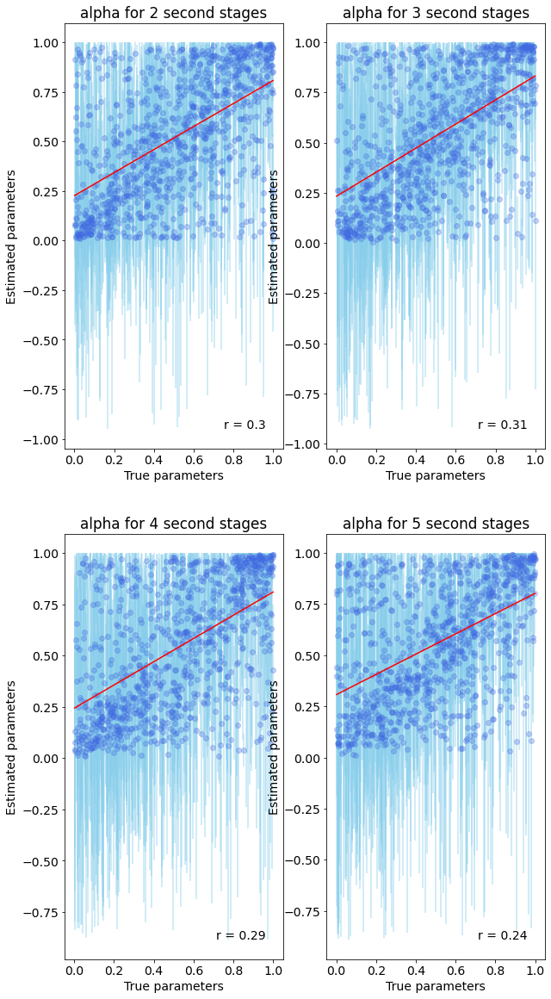

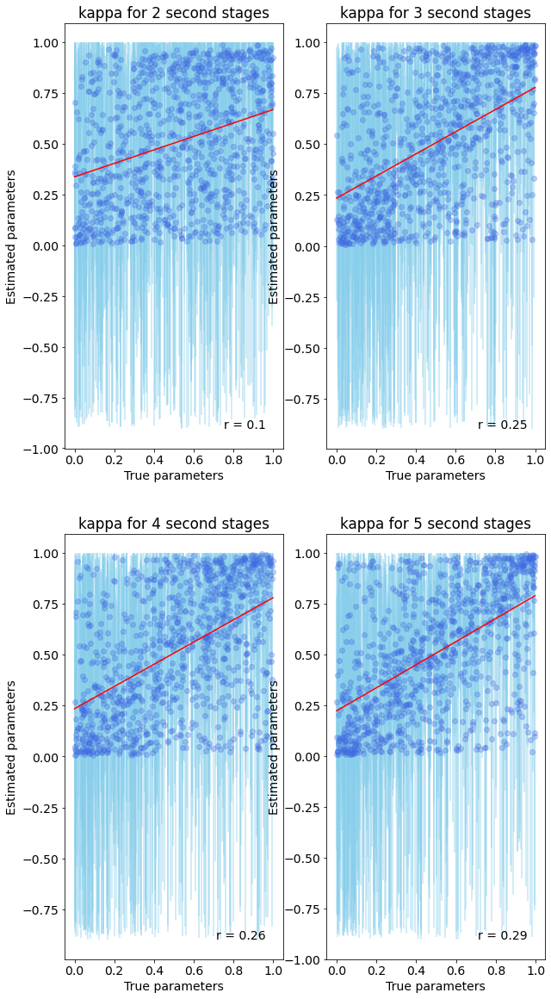

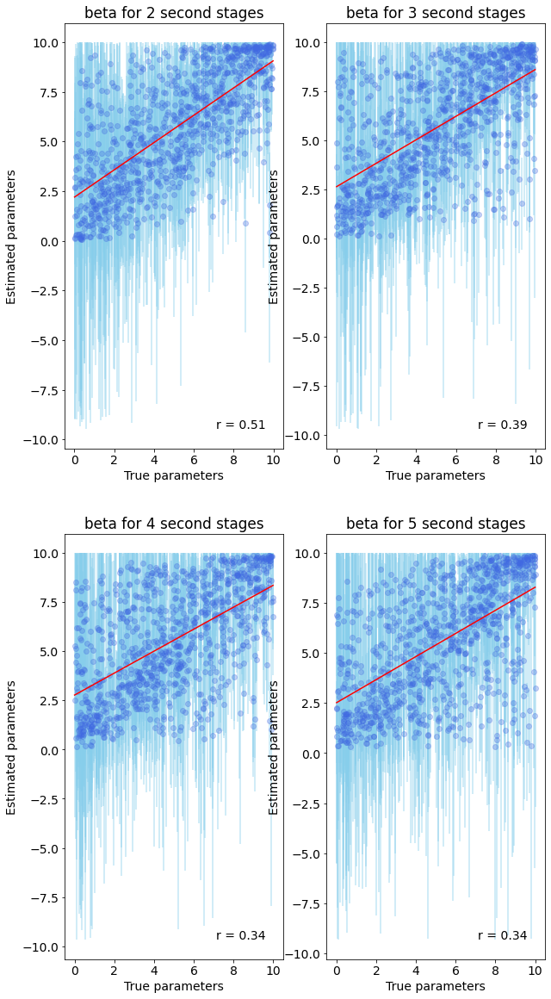

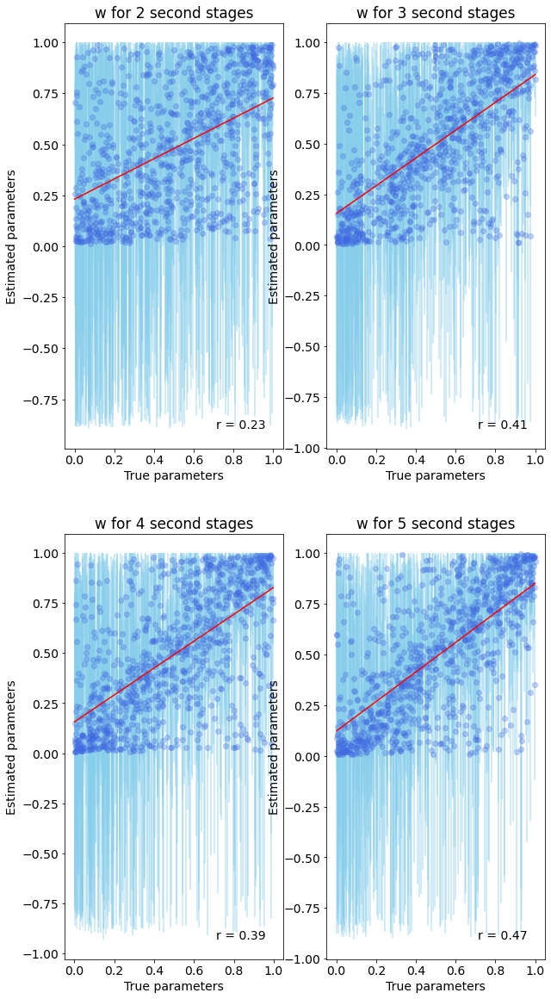

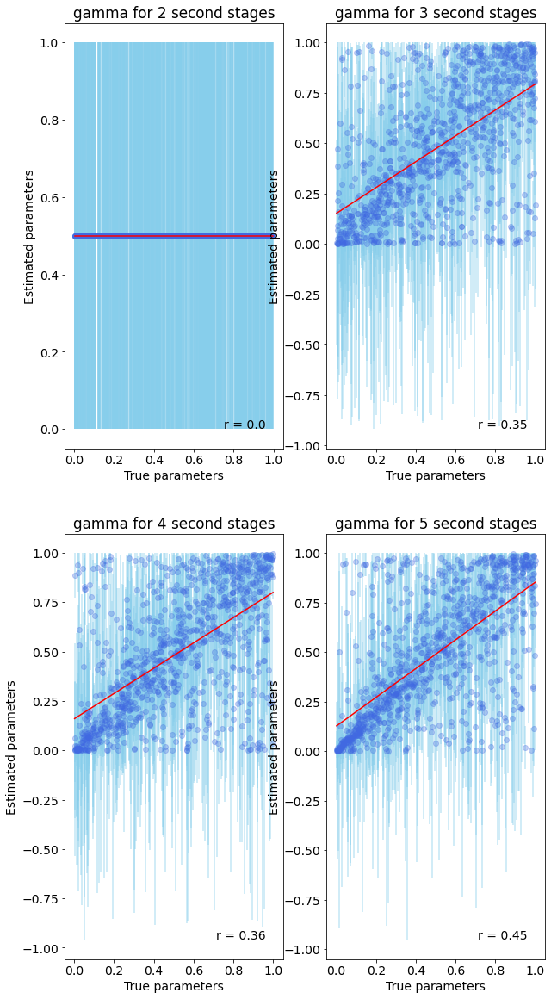

In [8]:
second_stages = [2,3,4,5]
parameters = ['alpha', 'kappa', 'beta', 'w', 'gamma']
datatable=[]
for i, parameter in enumerate(parameters):
    fig, axs = plt.subplots(2,2, figsize=(10,20), facecolor='w', edgecolor='k')
    for s, ax in zip(range(len(second_stages)), axs.flat):
        file = 'recovery_counterfactual_moretrials_diff_lr_' + str(second_stages[s]) + 'states_5params_nrits1000.mat'

        curr_file = io.loadmat(file)
        CI_table = curr_file['data']['CI_table']
        CI_table = np.asarray(CI_table)[0][0]
        corrtable = curr_file['data']['corrtable']
        corrtable = np.asarray(corrtable)[0][0]

        num_data = len(corrtable)

        x = corrtable[:num_data,i*2]
        y = corrtable[:num_data,i*2+1]
        ci_upper = CI_table[:num_data,i*2]
        ci_lower = CI_table[:num_data,i*2+1]

        slope, intercept = np.polyfit(x,y,1) # linear model adjustment
        y_model = np.polyval([slope, intercept], x)   # modeling...

        x_mean = np.mean(x)
        y_mean = np.mean(y)
        n = x.size                        # number of samples

        # calculating the r2
        # https://www.statisticshowto.com/probability-and-statistics/coefficient-of-determination-r-squared/
        # Pearson's correlation coefficient
        numerator = np.sum((x - x_mean)*(y - y_mean))
        denominator = ( np.sum((x - x_mean)**2) * np.sum((y - y_mean)**2) )**.5
        correlation_coef = numerator / denominator
        r2 = correlation_coef**2

        # mean squared error
        MSE = 1/n * np.sum( (y - y_model)**2 )

        # to plot the adjusted model
        x_line = np.linspace(np.min(x), np.max(x), 100)
        y_line = np.polyval([slope, intercept], x_line)

        ############### Ploting
        plt.rcParams.update({'font.size': 14})
  
        title_name = parameter + ' for ' + str(second_stages[s]) + ' second stages'
        ax.set_title(title_name)
        ax.plot(x, y, 'o', color = 'royalblue', alpha=0.3)
        ax.plot(x_line, y_line, color = 'red')
        ax.annotate('r = '+str(np.round(r2,2)),xy=(1,0),xycoords='axes fraction',
            xytext=(-20, 20), textcoords='offset pixels',
            horizontalalignment='right',
            verticalalignment='bottom')
        ax.errorbar(x,y,yerr=ci_upper-y,linestyle='',color='skyblue', alpha=.5)

        ax.set_xlabel('True parameters')
        ax.set_ylabel('Estimated parameters')
        
        print("The correlation coefficient for {} {} stages: {}".format(parameter, second_stages[s], np.round(r2,2)))

        datatable.append(np.round(r2,2))
for i in datatable:
    print(i)